**<div align='center'>ECMM445 – Learning from Data</div>**

**<div align='center'>Coursework : Find your data and learn from it</div>**

**<div align='center'>Student Id :740003228</div>**

**<div align='center'>MSc Data Science Academic Year 2024/25</div>**

**Research Question:**


The most unforgettable aspect of Exeter is its pleasant weather, paired with the intriguing unpredictability of its climate—one moment it's sunny, and just five minutes later, it starts pouring, often reminding us that we’ve left our umbrella at home. The geospatial aspect of the Exeter City with the rolling hills along the coastline contributes to the microclimatic variations resulting in unpredictability. Eventhough there are technological advancements to acurately predict the local weather, predicting extreme, localized events like storms and sudden snowfall remains a significant challenge. Addressing this gap will help the people to prepare themselves for the unpredictable weather. 

Hence resulting in the research question which is addressed in this coursework: ***"How can local weather, specifically the probability of precipitation in Exeter, UK, be forecasted through the analysis of historical data?"***.

**Introduction to Dataset:**

The data source for the research question is obtained from the famous data archive ***https://www.data-is-plural.com/archive/*** featuring the "2024.09.25 edition". This edition provides details about one of the Open-source weather APIs which is ***Open-meteo (https://open-meteo.com/)***.

***Open-meteo***, an open source project built on the data from national weather services, offers a range of weather and climate APIs that are free for non-commercial use. They include weather forecasts (temperature, humidity, precipitation, wind speed, etc.), daily historical weather since 1940, climate change model outputs, marine wave forecasts, air quality assessments, and more.

In order to source historical weather data , we have used the ***Historical Weather API*** in the Open-meteo site to download hourly weather data starting from **January 1st ,2010** to **November 15th, 2024**. 

The downloaded historical weather data consists of hourly information including 
- temperature(°F)
- relative_humidity(%)
- dew_point(°F)
- precipitation(mm)
- rain (mm)
- snowfall (cm)
- snow_depth (m)
- weather code (wmo code)
- surface pressure (hPa)
- cloud cover (%)
- wind speed at 10m & 100m (mp/h)
- wind direction 10m & 100m (°)
- wind gusts at 10m (mp/h) 

**Type of Machine Learning Technique used:**

Since the variables involved in the dataset are labeled, the Machine learning technique to be used is obviously **Supervised Learning**.

The endgoal of this research question is to forecast the amount of precipitation (mm) or the determining whether there will be any precipitation ie.) finding the probability of rain. This lead to the discussion on which supervised machine learning techniques should be used whether regression or classification. 

Since the likelihood of precipitation falls under the categorical label with values **Rain** and **No rain** , it is considered to use the **Classification Supervised Machine learning techniques** even though we used regression techniques to figure out the best feature combinations.

Since there are multiple features involved in the modelling process to make a forecast, this process comes under the category of **multiple classification task**. Also , it is a **Univariate classification task** since we are only trying to predict a single value for each historical data.

**Techniques used** : Logistic regression, Decision trees, Random forests,Gradient booster, kNN classifer,Perceptron --(Support vector machines (SVM) Neural networks) for classification.

In [1]:
!pip install latex

In [2]:
!pip install -U kaleido

**Preprocessing of Data:**

Lets import all the important python modules required for this coursework

In [3]:
# Pandas Packages
import pandas as pd
from pandas.api.types import CategoricalDtype
import itertools

# Matplotlib packages
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import MaxNLocator
import seaborn as sns
import numpy as np
from numpy.polynomial.polynomial import Polynomial
import plotly.express as px

#Data Preprocessing 
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE

# Models
from sklearn.linear_model import LinearRegression,Ridge,Lasso
from sklearn.linear_model import LassoCV, RidgeCV,RidgeClassifier
from sklearn.linear_model import RidgeClassifier
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import Perceptron
from sklearn.cluster import KMeans,DBSCAN
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV


# import the metrics class
from sklearn import metrics
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error,mean_absolute_error
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
from scipy.interpolate import griddata

%matplotlib inline

**Loading the weather csv data downloaded from the open-meteo.com into the pandas dataframe**

In [4]:
file_name = f"open-meteo-hourly-dataset.csv"
data =  pd.read_csv(file_name)

Viewing the data in the dataframe "data"

In [5]:
data.head()

,time,temperature_2m (°F),relative_humidity_2m (%),dew_point_2m (°F),precipitation (mm),rain (mm),snowfall (cm),snow_depth (m),weather_code (wmo code),pressure_msl (hPa),cloud_cover (%),wind_speed_10m (mp/h),wind_speed_100m (mp/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (mp/h)
0,2010-01-01T00:00,31.8,86,28.0,0.0,0.0,0.0,0.0,3,1003.3,86,11.3,19.8,21,27,21.9
1,2010-01-01T01:00,31.3,86,27.7,0.0,0.0,0.0,0.0,3,1003.4,93,11.1,19.6,19,24,20.8
2,2010-01-01T02:00,30.7,87,27.2,0.0,0.0,0.0,0.0,3,1003.5,81,11.4,20.1,16,21,20.8
3,2010-01-01T03:00,30.3,87,26.8,0.0,0.0,0.0,0.0,0,1004.0,4,11.5,20.4,13,19,20.8
4,2010-01-01T04:00,29.9,87,26.5,0.0,0.0,0.0,0.0,0,1004.3,3,11.2,20.0,13,18,20.6


In [6]:
# Displaing the column details like name, total record count with not null values, type 
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130392 entries, 0 to 130391
Data columns (total 16 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   time                      130392 non-null  object 
 1   temperature_2m (°F)       130392 non-null  float64
 2   relative_humidity_2m (%)  130392 non-null  int64  
 3   dew_point_2m (°F)         130392 non-null  float64
 4   precipitation (mm)        130392 non-null  float64
 5   rain (mm)                 130392 non-null  float64
 6   snowfall (cm)             130392 non-null  float64
 7   snow_depth (m)            129912 non-null  float64
 8   weather_code (wmo code)   130392 non-null  int64  
 9   pressure_msl (hPa)        130392 non-null  float64
 10  cloud_cover (%)           130392 non-null  int64  
 11  wind_speed_10m (mp/h)     130392 non-null  float64
 12  wind_speed_100m (mp/h)    130392 non-null  float64
 13  wind_direction_10m (°)    130392 non-null  i

In [7]:
# Showing the summary of the numerical attributes of the fields in the dataframe. 
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
temperature_2m (°F),130392.0,51.694930,9.584527,10.1,45.2,51.8,58.5,89.30
relative_humidity_2m (%),130392.0,82.312389,12.070598,24.0,75.0,85.0,92.0,100.00
dew_point_2m (°F),130392.0,46.127127,8.610142,-0.1,40.2,46.9,52.6,69.10
precipitation (mm),130392.0,0.100743,0.370335,0.0,0.0,0.0,0.0,12.40
rain (mm),130392.0,0.099692,0.368299,0.0,0.0,0.0,0.0,12.40
snowfall (cm),130392.0,0.000752,0.021608,0.0,0.0,0.0,0.0,2.31
snow_depth (m),129912.0,0.000446,0.004488,0.0,0.0,0.0,0.0,0.11
weather_code (wmo code),130392.0,11.317136,19.896166,0.0,1.0,3.0,3.0,75.00
pressure_msl (hPa),130392.0,1015.326875,11.035546,955.1,1009.1,1016.4,1022.7,1049.90
cloud_cover (%),130392.0,68.926100,35.704643,0.0,39.0,88.0,100.0,100.00


In [8]:
# Lets rename the columns for more simplicity

data = data.rename(columns={"temperature_2m (°F)": "temp", "relative_humidity_2m (%)": "humidity",
                            "dew_point_2m (°F)":"dew","precipitation (mm)":"precip","rain (mm)":"rain",
                            "snowfall (cm)":"snowfall","snow_depth (m)":"snowdepth","weather_code (wmo code)":"wmocode",
                            "pressure_msl (hPa)":"surfpressure","cloud_cover (%)":"cloudcover","wind_speed_10m (mp/h)":"windspeed10m",
                            "wind_speed_100m (mp/h)":"windspeed100m","wind_direction_10m (°)":"winddir10m","wind_direction_100m (°)":"winddir100m",
                            "wind_gusts_10m (mp/h)":"windgusts"})
data.head()

,time,temp,humidity,dew,precip,rain,snowfall,snowdepth,wmocode,surfpressure,cloudcover,windspeed10m,windspeed100m,winddir10m,winddir100m,windgusts
0,2010-01-01T00:00,31.8,86,28.0,0.0,0.0,0.0,0.0,3,1003.3,86,11.3,19.8,21,27,21.9
1,2010-01-01T01:00,31.3,86,27.7,0.0,0.0,0.0,0.0,3,1003.4,93,11.1,19.6,19,24,20.8
2,2010-01-01T02:00,30.7,87,27.2,0.0,0.0,0.0,0.0,3,1003.5,81,11.4,20.1,16,21,20.8
3,2010-01-01T03:00,30.3,87,26.8,0.0,0.0,0.0,0.0,0,1004.0,4,11.5,20.4,13,19,20.8
4,2010-01-01T04:00,29.9,87,26.5,0.0,0.0,0.0,0.0,0,1004.3,3,11.2,20.0,13,18,20.6


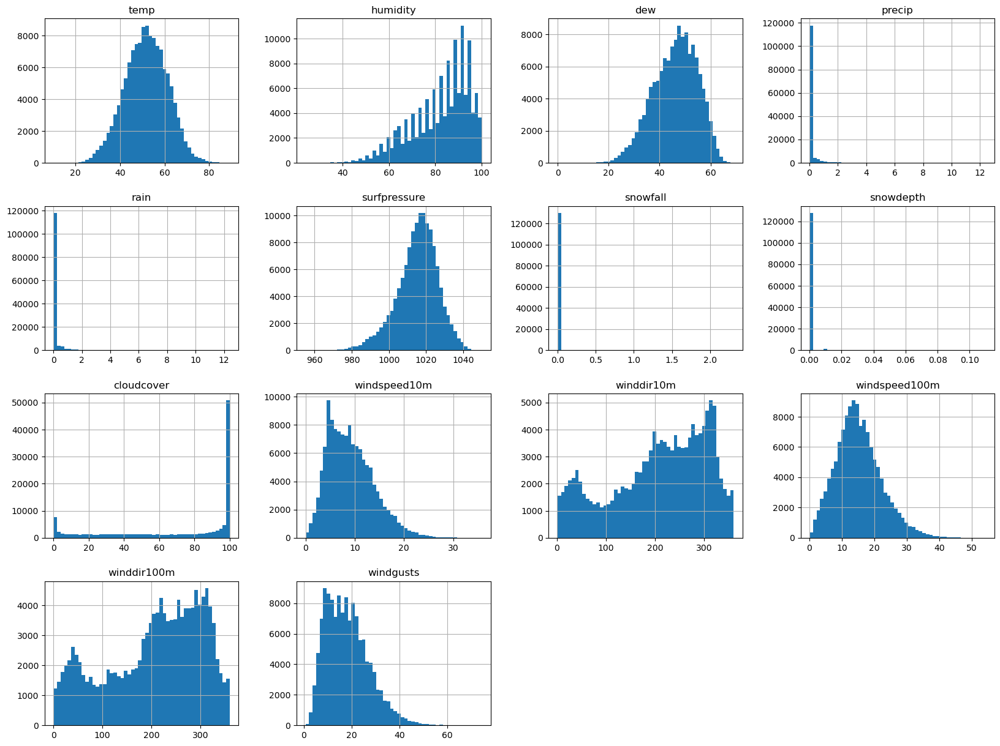

In [9]:
# In order to plot each numerical attribute , we use hist() method removing the time column
hist_data = data[['temp','humidity','dew','precip','rain','surfpressure','snowfall','snowdepth','cloudcover','windspeed10m','winddir10m','windspeed100m','winddir100m','windgusts']]
hist_data.hist(bins=50,figsize=(20,15))
plt.show()

In [10]:
# Adding columns month ,year , date to the dataframe data for further plotting and analysis
data['time'] = pd.to_datetime(data['time'])
data['date'] = data['time'].dt.date  # Extract date
data['month'] = pd.to_datetime(data['time'].dt.month, format='%m').dt.strftime('%B') 
data['year'] = data['time'].dt.year
data['MM-YYYY'] = data['month'].astype(str) +' ' + data['year'].astype(str)
data.head()

,time,temp,humidity,dew,precip,rain,snowfall,snowdepth,wmocode,surfpressure,cloudcover,windspeed10m,windspeed100m,winddir10m,winddir100m,windgusts,date,month,year,MM-YYYY
0,2010-01-01 00:00:00,31.8,86,28.0,0.0,0.0,0.0,0.0,3,1003.3,86,11.3,19.8,21,27,21.9,2010-01-01,January,2010,January 2010
1,2010-01-01 01:00:00,31.3,86,27.7,0.0,0.0,0.0,0.0,3,1003.4,93,11.1,19.6,19,24,20.8,2010-01-01,January,2010,January 2010
2,2010-01-01 02:00:00,30.7,87,27.2,0.0,0.0,0.0,0.0,3,1003.5,81,11.4,20.1,16,21,20.8,2010-01-01,January,2010,January 2010
3,2010-01-01 03:00:00,30.3,87,26.8,0.0,0.0,0.0,0.0,0,1004.0,4,11.5,20.4,13,19,20.8,2010-01-01,January,2010,January 2010
4,2010-01-01 04:00:00,29.9,87,26.5,0.0,0.0,0.0,0.0,0,1004.3,3,11.2,20.0,13,18,20.6,2010-01-01,January,2010,January 2010


In [11]:
# Checking for null values in the dataframe to update or fill the missing values with required values

data.isnull().sum()

time               0
temp               0
humidity           0
dew                0
precip             0
rain               0
snowfall           0
snowdepth        480
wmocode            0
surfpressure       0
cloudcover         0
windspeed10m       0
windspeed100m      0
winddir10m         0
winddir100m        0
windgusts          0
date               0
month              0
year               0
MM-YYYY            0
dtype: int64

In [12]:
# As per the above result, only the snowdepth column has null values
# Filling the NaN values with 0.0 values

data['snowdepth'] = data['snowdepth'].fillna(0.0)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130392 entries, 0 to 130391
Data columns (total 20 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   time           130392 non-null  datetime64[ns]
 1   temp           130392 non-null  float64       
 2   humidity       130392 non-null  int64         
 3   dew            130392 non-null  float64       
 4   precip         130392 non-null  float64       
 5   rain           130392 non-null  float64       
 6   snowfall       130392 non-null  float64       
 7   snowdepth      130392 non-null  float64       
 8   wmocode        130392 non-null  int64         
 9   surfpressure   130392 non-null  float64       
 10  cloudcover     130392 non-null  int64         
 11  windspeed10m   130392 non-null  float64       
 12  windspeed100m  130392 non-null  float64       
 13  winddir10m     130392 non-null  int64         
 14  winddir100m    130392 non-null  int64         
 15  

In [13]:
# Using a function to define the precipitation percentage 
def getPrecipitation(value):
    prob = 0
    if value > 0.0 and value<=3.0:
        prob = 25
    elif value > 3.0 and value<=6.0:
        prob = 50
    elif value > 8.0 and value<=9.0:
        prob = 75
    elif value > 9.0:
        prob = 100
    return prob

In [14]:
# Adding a column called precipprob to store a probability value in percentage if the precip column has values greater than zero indicating 
# that there is a chance for precipitation.

data['precipprob'] = data['precip'].apply(lambda x : getPrecipitation(x))
data['precipprob'].unique()

array([  0,  25,  50, 100,  75], dtype=int64)

***Data Visualization:***

Lets start plotting the weather historical data to learn the trends and patterns between the multiple features and precipitation data using matplotlib and seaborn visualization packages.

In order to visualise the trends and pattern , we are going to use 5 years of historical data from the year 2020 till November 2024.

In [15]:
plot_data = data.copy()
years = [2020,2021,2022,2023,2024]
plot_data = plot_data[plot_data['year'].isin(years)].reset_index()
plot_data.shape

(42744, 22)

In [16]:
# Lets plot the mean , minimum and maximum of temperatures over 5 years of time period .
# Group by year and month
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 
               'July', 'August', 'September', 'October', 'November', 'December']
month_cat = CategoricalDtype(categories=month_order, ordered=True)
# Apply the month order
plot_data['month'] = plot_data['month'].astype(month_cat)
grouped_temp = plot_data.groupby(['year', 'month'],observed=False)['temp']
# Calculate statistics
monthly_temp_stats = grouped_temp.agg(['mean', 'min', 'max']).reset_index().dropna()
monthly_temp_stats['MM-YYYY'] = monthly_temp_stats['month'].astype(str) +' ' + monthly_temp_stats['year'].astype(str)
monthly_temp_stats

,year,month,mean,min,max,MM-YYYY
0,2020,January,44.254839,26.6,56.8,January 2020
1,2020,February,45.736782,34.5,56.0,February 2020
2,2020,March,44.643952,29.1,56.9,March 2020
3,2020,April,51.420972,31.3,73.6,April 2020
4,2020,May,55.047984,36.0,76.7,May 2020
5,2020,June,58.785139,45.5,78.6,June 2020
6,2020,July,61.160753,47.1,82.8,July 2020
7,2020,August,63.574194,45.3,84.1,August 2020
8,2020,September,58.266667,40.5,75.9,September 2020
9,2020,October,52.022446,41.1,61.3,October 2020


In [17]:
# Updating the plot parameters
plt.rcParams.update({'figure.figsize':(10,7),
"axes.edgecolor":"black",'axes.linewidth':2.5,'savefig.facecolor':"0.8",
'xtick.labelsize':16,'ytick.labelsize':16,'figure.edgecolor':"black","text.usetex": False,
    "font.family": "sans-serif"})


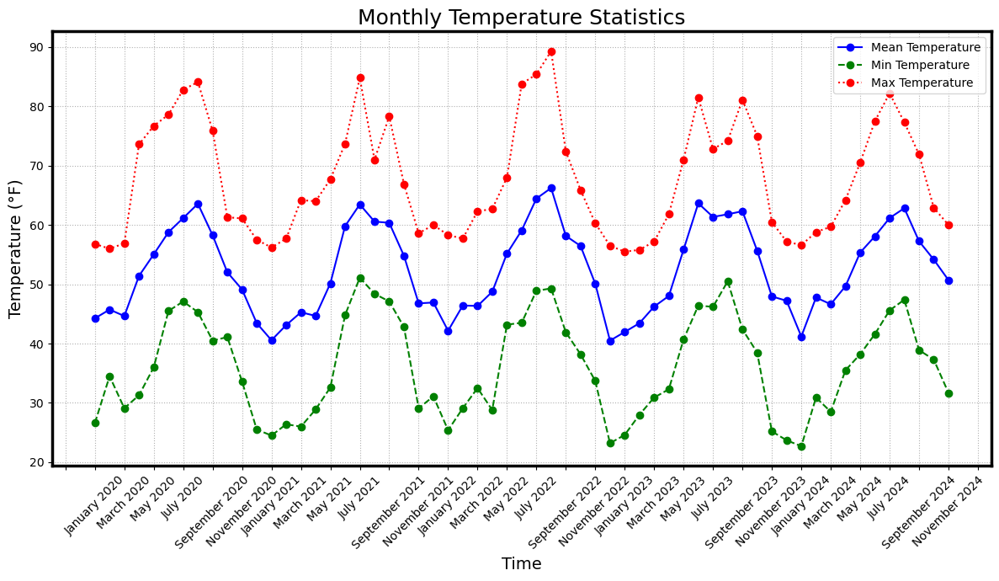

In [18]:
plt.figure(figsize=(12,7))
plt.plot(monthly_temp_stats['MM-YYYY'], monthly_temp_stats['mean'],color='blue', label='Mean Temperature', marker='o')
plt.plot(monthly_temp_stats['MM-YYYY'], monthly_temp_stats['min'],color='green', label='Min Temperature', linestyle='--',marker='o')
plt.plot(monthly_temp_stats['MM-YYYY'], monthly_temp_stats['max'],color='red', label='Max Temperature', linestyle=':',marker='o')

plt.title(r'Monthly Temperature Statistics', fontsize=18)
plt.xlabel(r'Time', fontsize=14)
plt.ylabel(r'Temperature (°F)', fontsize=14,loc='center')

plt.legend(loc='upper right')
plt.grid(alpha=1, linestyle='dotted')
plt.xticks(rotation=45,fontsize = 10)
plt.yticks(fontsize=10)
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=60))
plt.tight_layout()
plt.savefig(r'images\\Temperature_over_time.png', dpi=300)

In [19]:
# Lets plot the mean precipitation over years

grouped_rain = plot_data.groupby(['year', 'month'],observed=False)['precip']

# Calculate statistics
rain_stats = grouped_rain.agg(['mean', 'max']).reset_index().dropna()
rain_stats

,year,month,mean,max
0,2020,January,0.105108,4.0
1,2020,February,0.231753,4.3
2,2020,March,0.080376,3.5
3,2020,April,0.061250,2.6
4,2020,May,0.030645,2.1
5,2020,June,0.168194,3.4
6,2020,July,0.067742,4.0
7,2020,August,0.172312,7.5
8,2020,September,0.042361,2.7
9,2020,October,0.176075,4.5


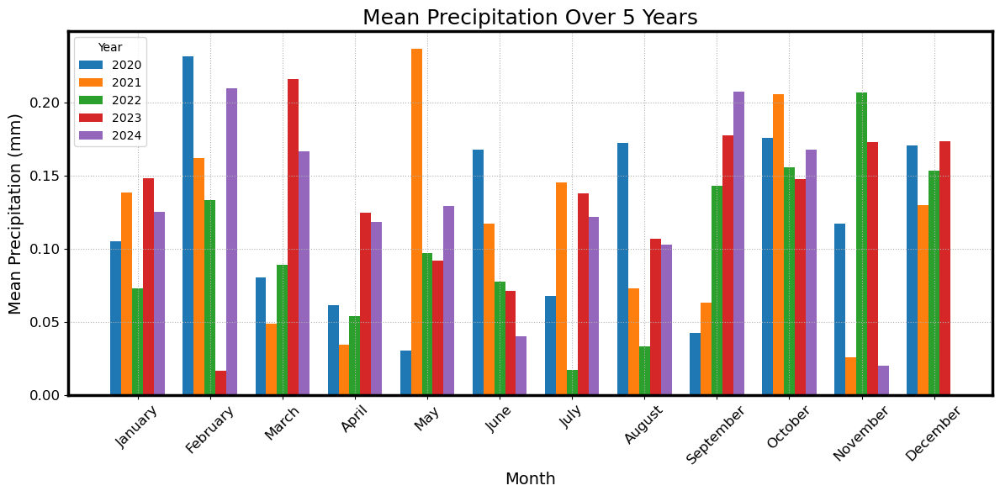

In [20]:
colormap = plt.colormaps.get_cmap('tab10')  # 'tab10' is vibrant and distinct

pivot_data = rain_stats.pivot(index='month', columns='year', values='mean')

# Plotting the mean temperature each month over five years
months = pivot_data.index
years = pivot_data.columns
x = np.arange(len(months))  # Positions for months
width = 0.15  # Bar width

fig, ax = plt.subplots(figsize=(12, 6))

# Create grouped bars for each year
for i, year in enumerate(years):
    ax.bar(x + i * width, pivot_data[year], width, label=str(year), color=colormap(i))

# Customizing the chart
ax.set_xlabel(r'Month', fontsize=14)
ax.set_ylabel(r'Mean Precipitation (mm)', fontsize=14)
ax.set_title(r'Mean Precipitation Over 5 Years', fontsize=18)
ax.set_xticks(x + width * (len(years) - 1) / 2)
ax.set_xticklabels(months, rotation=45)
ax.legend(title='Year')
plt.grid(alpha=1,linestyle='dotted')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.savefig(r'images\\Mean_precipitation_5_years.png', dpi=300)

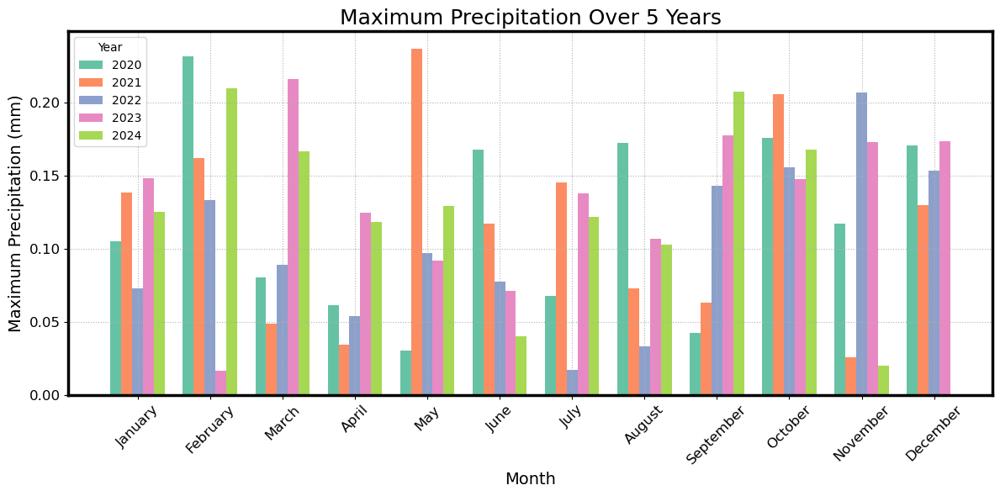

In [21]:
colormap = plt.colormaps.get_cmap('Set2')  # 'tab10' is vibrant and distinct

pivot_max_data = rain_stats.pivot(index='month', columns='year', values='max')

# Plotting the mean temperature each month over five years
months = pivot_max_data.index
years = pivot_max_data.columns
x = np.arange(len(months))  # Positions for months
width = 0.15  # Bar width

fig, ax = plt.subplots(figsize=(12, 6))

# Create grouped bars for each year
for i, year in enumerate(years):
    ax.bar(x + i * width, pivot_data[year], width, label=str(year), color=colormap(i))

# Customizing the chart
ax.set_xlabel(r'Month', fontsize=14)
ax.set_ylabel(r'Maximum Precipitation (mm)', fontsize=14)
ax.set_title(r'Maximum Precipitation Over 5 Years', fontsize=18)
ax.set_xticks(x + width * (len(years) - 1) / 2)
ax.set_xticklabels(months, rotation=45)
ax.legend(title='Year')
plt.grid(alpha=1,linestyle='dotted')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.savefig(r'images\\Maximum_precipitation_5_years.png', dpi=300)

In [22]:
# Plotting temperature over precipitation
fig = px.scatter(
    plot_data,
    x="temp",
    y="precip",
    size="precip",
    color="temp",
    hover_data=["humidity"],
    title="Interactive Temperature vs. Precipitation",
)
fig.update_layout(xaxis_title="Temperature (°F)", yaxis_title="Precipitation (mm)")
#fig.write_image('images/Temperature_vs_precipitation.png')
fig.show()

In [23]:
# Plotting Dew over Precipitation
fig = px.scatter(
    plot_data,
    x="dew",
    y="precip",
    size="precip",
    color="dew",
    hover_data=["humidity"],
    title="Interactive Dew vs Precipitation",
)
fig.update_layout(xaxis_title="Dew (%)", yaxis_title="Precipitation (mm)")
fig.show()

In [24]:
corr_data = plot_data[['temp','humidity','dew','precip','rain','snowfall','snowdepth','surfpressure','cloudcover','windspeed10m','windspeed100m',
                       'winddir10m','winddir100m','windgusts']]
corr_data

,temp,humidity,dew,precip,rain,snowfall,snowdepth,surfpressure,cloudcover,windspeed10m,windspeed100m,winddir10m,winddir100m,windgusts
0,43.5,93,41.7,0.0,0.0,0.0,0.0,1028.8,100,4.2,9.6,74,101,10.1
1,44.0,93,42.1,0.0,0.0,0.0,0.0,1028.6,100,3.8,8.9,62,100,7.6
2,45.0,93,43.1,0.0,0.0,0.0,0.0,1028.2,100,3.1,9.1,86,126,7.4
3,46.3,96,45.3,0.0,0.0,0.0,0.0,1028.1,100,4.1,10.2,135,144,6.9
4,46.8,96,45.7,0.0,0.0,0.0,0.0,1028.1,100,4.3,9.9,141,142,8.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42739,41.1,100,41.1,0.0,0.0,0.0,0.0,1025.5,86,1.6,3.3,240,211,2.7
42740,40.1,100,40.1,0.0,0.0,0.0,0.0,1025.3,100,1.1,3.9,281,210,2.7
42741,38.4,100,38.4,0.0,0.0,0.0,0.0,1025.3,99,1.3,3.3,315,230,3.1
42742,38.4,100,38.4,0.0,0.0,0.0,0.0,1025.2,100,2.3,2.1,337,286,5.4


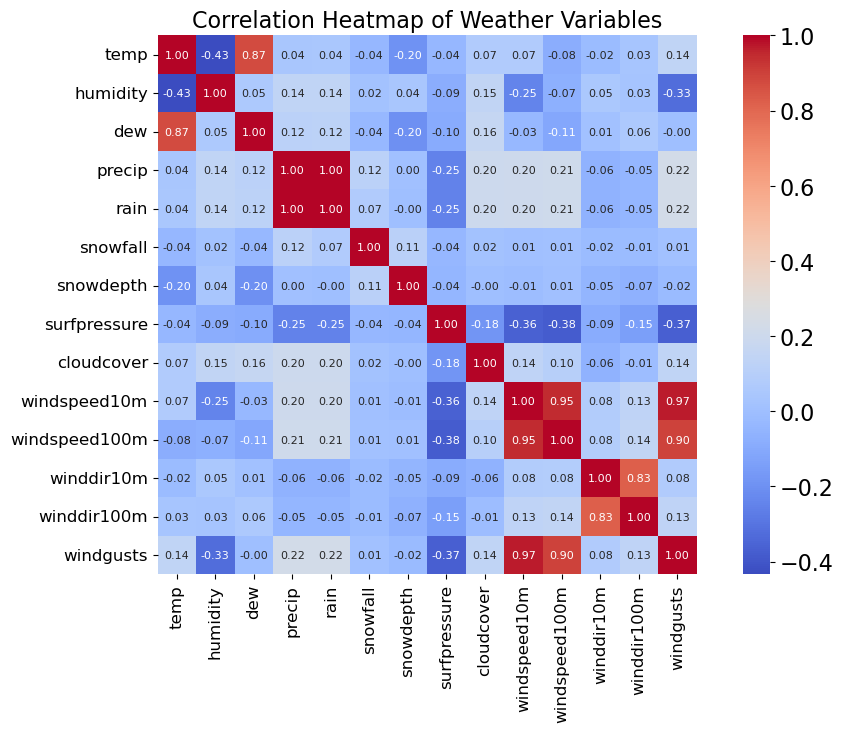

In [25]:
# Correlation heatmap
corr_matrix = corr_data.corr()

plt.figure(figsize=(12, 7))
sns.heatmap(corr_matrix, annot=True,annot_kws={"size": 8}, cmap="coolwarm", fmt=".2f", square=True)
plt.title("Correlation Heatmap of Weather Variables", fontsize=16)
plt.tick_params(axis='both', labelsize=12)
plt.savefig(r'images//Correlation Heatmap of Weather Variables',dpi=300)

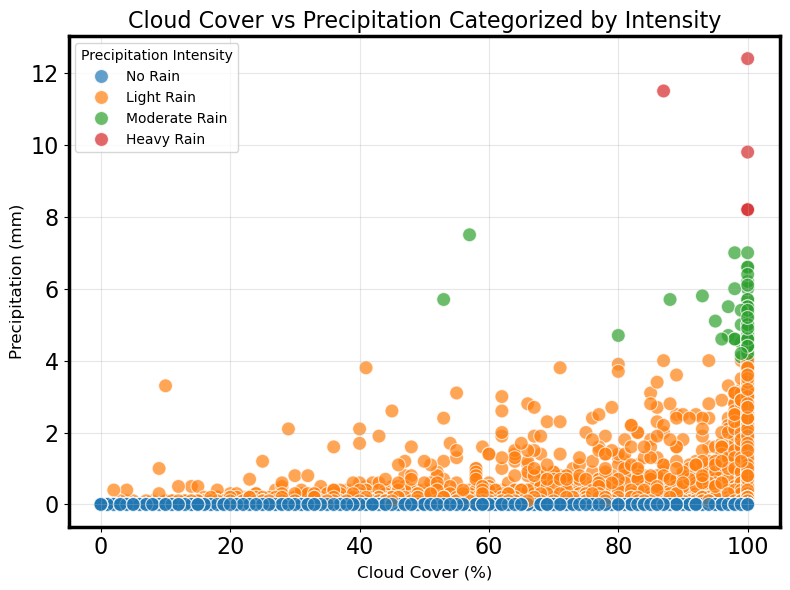

In [26]:
# Categorize rain intensity
conditions = [
    (plot_data["precip"] == 0),
    (plot_data["precip"]> 0) & (plot_data["precip"] <= 4),
    (plot_data["precip"] > 4) & (plot_data["precip"] <= 8),
    (plot_data["precip"] > 8)
]
categories = ["No Rain", "Light Rain", "Moderate Rain", "Heavy Rain"]
plot_data["rain_category"] = pd.cut(plot_data["precip"], bins=[ -1,0, 4, 8, float('inf')], labels=categories)

# Scatter plot with categories
plt.figure(figsize=(8, 6))
sns.scatterplot(data=plot_data, x="cloudcover", y="precip", hue="rain_category", s=100, alpha=0.7)
plt.title("Cloud Cover vs Precipitation Categorized by Intensity", fontsize=16)
plt.xlabel("Cloud Cover (%)", fontsize=12)
plt.ylabel("Precipitation (mm)", fontsize=12)
plt.legend(title="Precipitation Intensity")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

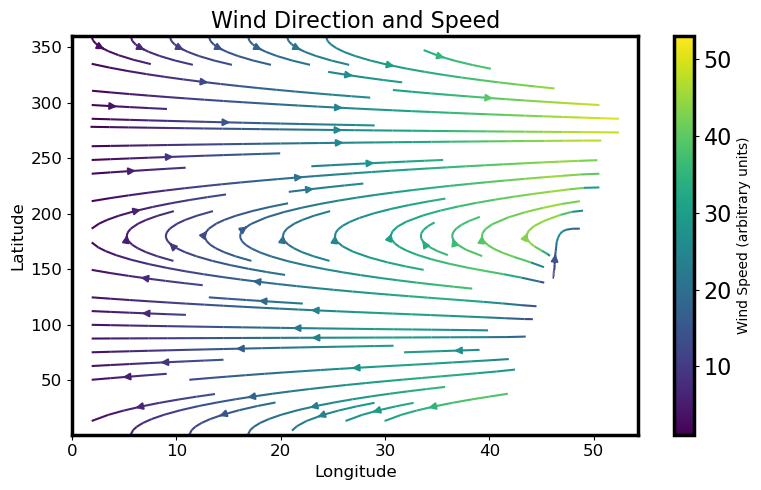

In [27]:
# Plotting the wind speed and wind direction direction 

stream_plot_data = plot_data.copy()
x_unsort = np.array(stream_plot_data["windspeed100m"])
y_unsort = np.array(stream_plot_data["winddir100m"])
x = np.linspace(min(x_unsort), max(x_unsort), 50)  # Adjust the range and resolution
y = np.linspace(min(y_unsort), max(y_unsort), 50)
X, Y = np.meshgrid(x, y)
from scipy.interpolate import griddata
# Original data points and corresponding vector components
points = np.column_stack((x_unsort, y_unsort))
#sorted_indices = np.argsort(x_unsort)
#x_sort = x_unsort[sorted_indices]
#y_sort = y_unsort[sorted_indices]

u= -x_unsort * np.sin(np.radians(y_unsort))
v = -x_unsort * np.cos(np.radians(y_unsort))
U = griddata(points, u, (X, Y), method='linear')
V = griddata(points, v, (X, Y), method='linear')
plt.figure(figsize=(8, 5))
plt.streamplot(X, Y, U, V, color=np.sqrt(U**2 + V**2), cmap='viridis')
plt.colorbar(label='Wind Speed (arbitrary units)')
plt.title('Wind Direction and Speed',fontsize=16)
plt.xlabel('Longitude',fontsize=12)
plt.ylabel('Latitude',fontsize=12)
plt.tick_params(axis='both', labelsize=12)
plt.tight_layout()
plt.savefig(r'images//Wind_Direction_and_Speed.png',dpi=300)

***Dimensionality Reduction:***

Since precipitation is dependent on multiple features like temperature, dew, humidity, wind gusts, speed and direction at 10m & 100m, cloud cover etc, it is important to figure out the important features that needed to used to create machine learning models for this research problem.

For this process, we have used the below 2 methods 
- Feature selection method is used which is one of the wrapper methods. 
- Variance thresholding  

At the end of the process, we decided to go with the variance thresholding since the score from the feature selection method are not satisfactory.

***Feature selection*** 

In [28]:
feature_list = []

In [29]:
def find_features(x,y,x_str,y_str):
    X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.20,random_state=42)
    mul_reg = LinearRegression()
    mul_reg.fit(X_train,y_train)
    result = {}
    result['x_columns'] = x_str
    result['x_count'] = len(list(x_str.split(',')))
    result['y_columns'] = y_str
    result['y_count']=len(list(y_str.split(',')))
    result['Slope'] = mul_reg.coef_[0]
    result['Intercept'] = mul_reg.intercept_
    y_pred = mul_reg.predict(X_test)
    weather_test = X_test.copy()
    weather_test['precip'] = y_test
    weather_test['predicted_precip'] = y_pred
    score = r2_score(weather_test['precip'],weather_test['predicted_precip'])
    mae = mean_absolute_error(weather_test['precip'],weather_test['predicted_precip'])
    mse = np.sqrt(mean_absolute_error(weather_test['precip'],weather_test['predicted_precip']))
    result['score'] = score
    result['mae'] = mae
    result['mse'] = mse
    feature_list.append(result)


In [30]:
def find_combined_features(combined_list, target):
    for value in combined_list:
        if type(value) == tuple:
            new_feature_list = list(value)
            feature_str = ','.join(new_feature_list)
            target_str = target
            x = data[new_feature_list]
            y = data[target]
            find_features(x,y,feature_str,target_str)    
        else:      
            x = data[[value]]
            y = data[target]
            find_features(x,y,value,target)

In [31]:
features = ['temp','humidity','dew','cloudcover','surfpressure','windspeed100m','windspeed100m','windgusts']
target = 'precip'
for i in [1,2,3,4,5,6,7,8]:
    combined_list = list(itertools.combinations(features,i))
    find_combined_features(combined_list,target)

In [32]:
pd.options.display.max_colwidth = 100
featu_acc_df = pd.DataFrame(feature_list)
featu_acc_df

,x_columns,x_count,y_columns,y_count,Slope,Intercept,score,mae,mse
0,temp,1,precip,1,0.001455,0.026079,0.001347,0.163106,0.403864
1,humidity,1,precip,1,0.004331,-0.255246,0.019782,0.162010,0.402505
2,dew,1,precip,1,0.004752,-0.117906,0.012247,0.160937,0.401169
3,cloudcover,1,precip,1,0.002067,-0.041104,0.039063,0.160615,0.400768
4,surfpressure,1,precip,1,-0.008887,9.124621,0.070028,0.156376,0.395444
...,...,...,...,...,...,...,...,...,...
250,"temp,humidity,dew,surfpressure,windspeed100m,windspeed100m,windgusts",7,precip,1,0.043843,3.023786,0.144550,0.160208,0.400260
251,"temp,humidity,cloudcover,surfpressure,windspeed100m,windspeed100m,windgusts",7,precip,1,0.002070,4.250197,0.146947,0.161034,0.401290
252,"temp,dew,cloudcover,surfpressure,windspeed100m,windspeed100m,windgusts",7,precip,1,-0.017834,5.084348,0.142301,0.161144,0.401428
253,"humidity,dew,cloudcover,surfpressure,windspeed100m,windspeed100m,windgusts",7,precip,1,0.007041,4.332619,0.146533,0.161007,0.401257


In [33]:
sorted_df = featu_acc_df.sort_values(by=['score'], ascending=False)
sorted_df.head()

,x_columns,x_count,y_columns,y_count,Slope,Intercept,score,mae,mse
248,"temp,humidity,dew,cloudcover,surfpressure,windspeed100m,windgusts",7,precip,1,0.042654,2.842307,0.150607,0.160783,0.400978
247,"temp,humidity,dew,cloudcover,surfpressure,windspeed100m,windgusts",7,precip,1,0.042654,2.842307,0.150607,0.160783,0.400978
254,"temp,humidity,dew,cloudcover,surfpressure,windspeed100m,windspeed100m,windgusts",8,precip,1,0.042654,2.842307,0.150607,0.160783,0.400978
229,"temp,humidity,cloudcover,surfpressure,windspeed100m,windgusts",6,precip,1,0.002070,4.250197,0.146947,0.161034,0.401290
230,"temp,humidity,cloudcover,surfpressure,windspeed100m,windgusts",6,precip,1,0.002070,4.250197,0.146947,0.161034,0.401290


***Variance Thresholding:***

In [34]:
weather_data = data[['temp','humidity','dew','snowfall','snowdepth','surfpressure','cloudcover','windspeed100m','winddir100m','windgusts']]
weather_data.std().sort_values(ascending=False)

winddir100m      96.420750
cloudcover       35.704643
humidity         12.070598
surfpressure     11.035546
temp              9.584527
windgusts         8.996574
dew               8.610142
windspeed100m     7.024998
snowfall          0.021608
snowdepth         0.004480
dtype: float64

*Based on the above variance results, the top features other than snowfall, snowdepth with higher variance are selected for the modelling process.*

***Splitting of Data into training and test sets:***

In [37]:
X = data[['temp','humidity','dew','surfpressure','cloudcover','windspeed100m','winddir100m','windgusts']]
y = data['precipprob']

# Standardising the data using SMOTE()
#smote = SMOTE()
#X_resampled, y_resampled = smote.fit_resample(X, y)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [38]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((104313, 8), (26079, 8), (104313,), (26079,))

***Logistic Regression:***

In [45]:
# instantiate the model (using the default parameters)
logreg = LogisticRegression(max_iter=10000,random_state=42,class_weight='balanced')

# fit the model with data
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix

c:\Users\sneha\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



array([[14589,  4008,  1058,   503,  1204],
       [  953,  1805,  1405,   293,   187],
       [    3,    17,    47,     4,     2],
       [    0,     0,     0,     0,     0],
       [    0,     0,     1,     0,     0]], dtype=int64)

In [46]:
target_names = ['no rain', 'low rain','moderate rain','heavy rain','very heavy rain']
print(classification_report(y_test, y_pred, target_names=target_names))

                 precision    recall  f1-score   support

        no rain       0.94      0.68      0.79     21362
       low rain       0.31      0.39      0.34      4643
  moderate rain       0.02      0.64      0.04        73
     heavy rain       0.00      0.00      0.00         0
very heavy rain       0.00      0.00      0.00         1

       accuracy                           0.63     26079
      macro avg       0.25      0.34      0.23     26079
   weighted avg       0.82      0.63      0.71     26079



c:\Users\sneha\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

c:\Users\sneha\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

c:\Users\sneha\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



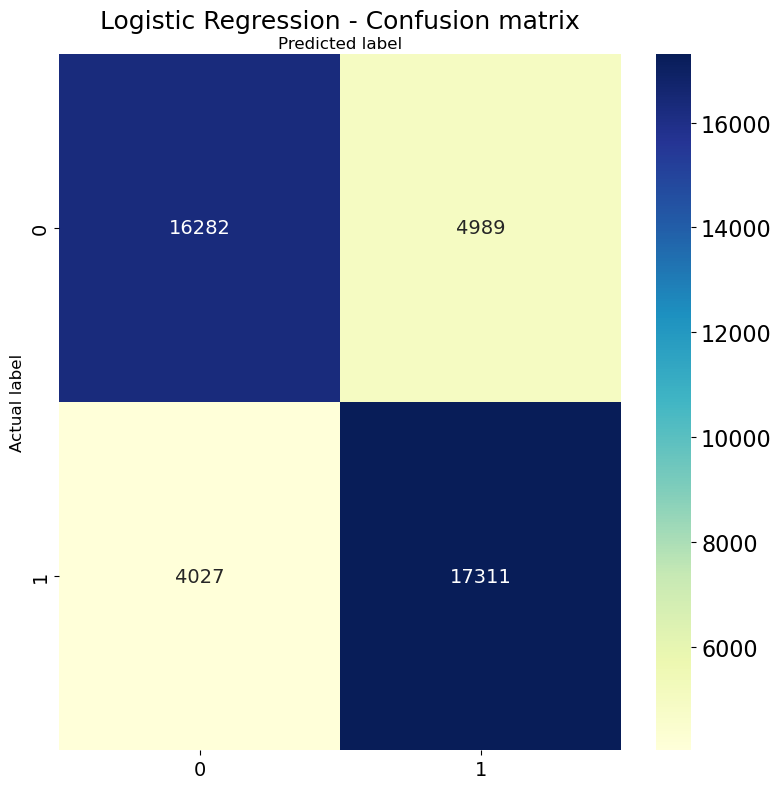

In [ ]:
# PLotting the logistic regression - confusion matrix
class_names=[0,1] # name  of classes
fig, ax = plt.subplots(figsize=(8,8))
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names,fontsize=14)
plt.yticks(tick_marks, class_names,fontsize=14)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, annot_kws={"size":14}, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.title('Logistic Regression - Confusion matrix', fontsize=18)
plt.ylabel('Actual label',fontsize=12)
plt.xlabel('Predicted label',fontsize=12)
plt.tight_layout()
plt.savefig(r'images\\Logistic_regression_conf_matrix.png',dpi=300)

***Decision Tree Classifier:***

In [ ]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion="entropy", max_depth=3)

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

decision_tree_cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
print(decision_tree_cnf_matrix)
print(classification_report(y_test, y_pred, target_names=['no rain','rain']))

[[15070  6201]
 [ 4637 16701]]
              precision    recall  f1-score   support

     no rain       0.76      0.71      0.74     21271
        rain       0.73      0.78      0.76     21338

    accuracy                           0.75     42609
   macro avg       0.75      0.75      0.75     42609
weighted avg       0.75      0.75      0.75     42609



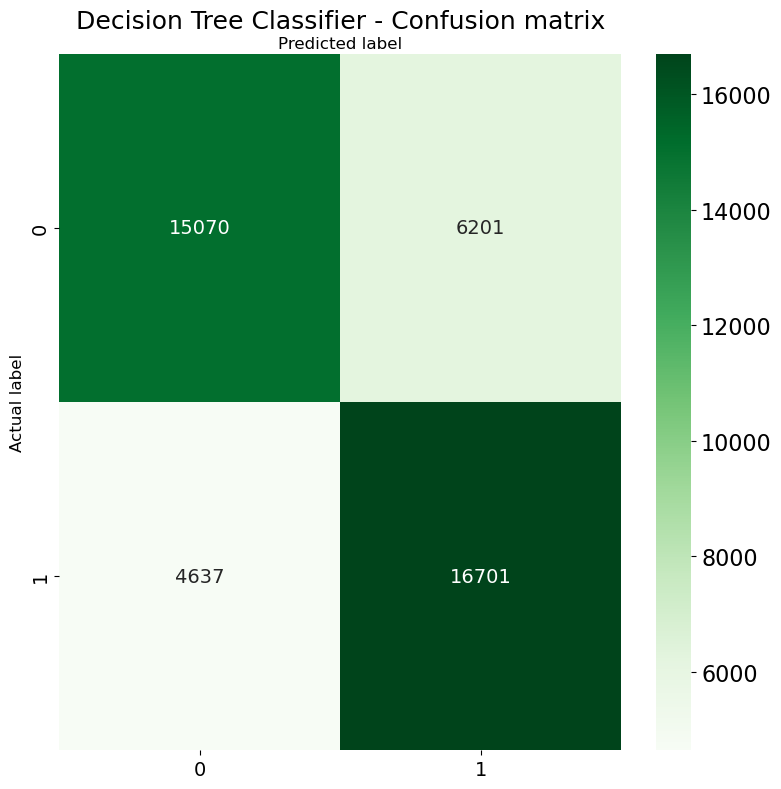

In [ ]:
# PLotting the Decision Tree Classifer - confusion matrix
class_names=[0,1] # name  of classes
fig, ax = plt.subplots(figsize=(8,8))
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names,fontsize=14)
plt.yticks(tick_marks, class_names,fontsize=14)
sns.heatmap(pd.DataFrame(decision_tree_cnf_matrix), annot=True, annot_kws={"size":14}, cmap="Greens" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.title('Decision Tree Classifier - Confusion matrix', fontsize=18)
plt.ylabel('Actual label',fontsize=12)
plt.xlabel('Predicted label',fontsize=12)
plt.tight_layout()
plt.savefig(r'images\\Decision_tree_conf_matrix.png',dpi=300)

***Random Forest Classifier:***

In [ ]:
# Create random forest classifer objest
rf = RandomForestClassifier()

#Train the model using training dataset
rf.fit(X_train, y_train)

#Predict using the trained model 
rf_y_pred = rf.predict(X_test)

rf_cnf_matrix = metrics.confusion_matrix(y_test, rf_y_pred)
print(rf_cnf_matrix)
print(classification_report(y_test, rf_y_pred, target_names=['no rain','rain']))

[[18805  2466]
 [ 1274 20064]]
              precision    recall  f1-score   support

     no rain       0.94      0.88      0.91     21271
        rain       0.89      0.94      0.91     21338

    accuracy                           0.91     42609
   macro avg       0.91      0.91      0.91     42609
weighted avg       0.91      0.91      0.91     42609



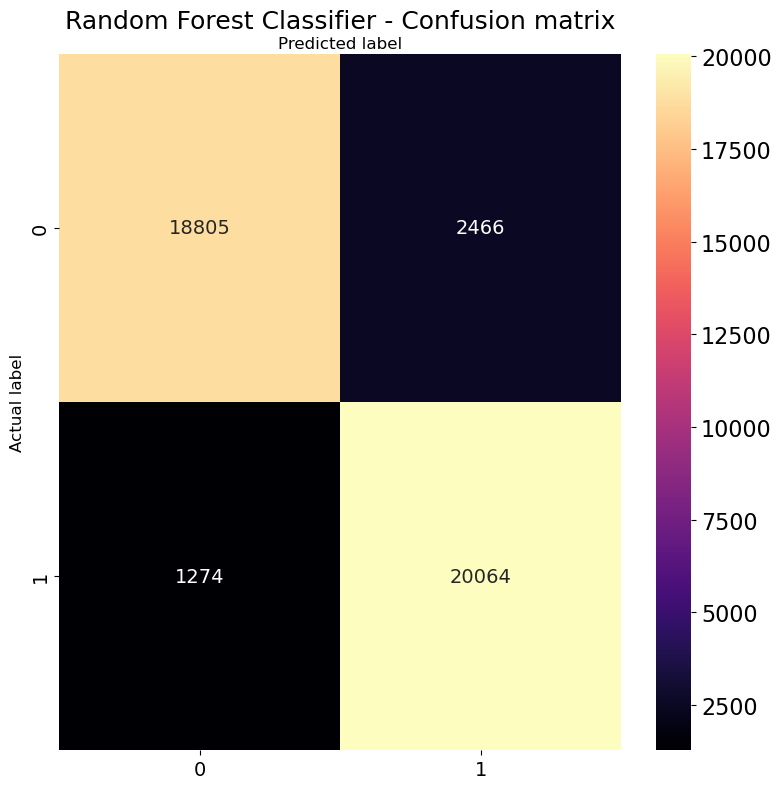

In [ ]:
# PLotting the Random Forest Classifier - confusion matrix
class_names=[0,1] # name  of classes
fig, ax = plt.subplots(figsize=(8,8))
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names,fontsize=14)
plt.yticks(tick_marks, class_names,fontsize=14)
sns.heatmap(pd.DataFrame(rf_cnf_matrix), annot=True, annot_kws={"size":14}, cmap="magma" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.title('Random Forest Classifier - Confusion matrix', fontsize=18)
plt.ylabel('Actual label',fontsize=12)
plt.xlabel('Predicted label',fontsize=12)
plt.tight_layout()
plt.savefig(r'images\\random_forest_conf_matrix.png',dpi=300)

***Gradient Boosting Classifier:***

In [ ]:
#Initialize the Gradient Boosting classifier model
grad_boost_reg = GradientBoostingClassifier(n_estimators=1,max_depth=70,learning_rate=100,criterion='squared_error')

# Train the model using training dataset
grad_boost_reg.fit(X_train,y_train)

# Predict by using the model
gb_y_pred = grad_boost_reg.predict(X_test)

gb_cnf_matrix = metrics.confusion_matrix(y_test, gb_y_pred)
print(gb_cnf_matrix)
print(classification_report(y_test, gb_y_pred, target_names=['no rain','rain']))

[[17762  3509]
 [ 2809 18529]]
              precision    recall  f1-score   support

     no rain       0.86      0.84      0.85     21271
        rain       0.84      0.87      0.85     21338

    accuracy                           0.85     42609
   macro avg       0.85      0.85      0.85     42609
weighted avg       0.85      0.85      0.85     42609



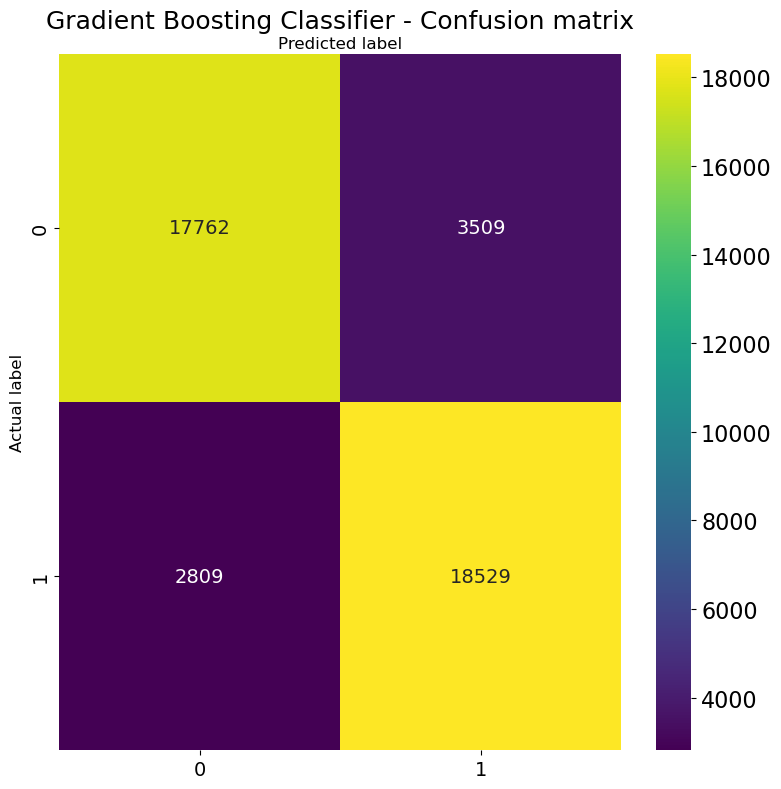

In [ ]:
# PLotting the Gradient Boosting Classifier - confusion matrix
class_names=[0,1] # name  of classes
fig, ax = plt.subplots(figsize=(8,8))
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names,fontsize=14)
plt.yticks(tick_marks, class_names,fontsize=14)
sns.heatmap(pd.DataFrame(gb_cnf_matrix), annot=True, annot_kws={"size":14}, cmap="viridis" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.title('Gradient Boosting Classifier - Confusion matrix', fontsize=18)
plt.ylabel('Actual label',fontsize=12)
plt.xlabel('Predicted label',fontsize=12)
plt.tight_layout()
plt.savefig(r'images\\gradient_boosting_conf_matrix.png',dpi=300)

***k- Nearest Neighbours Classifer:***

In [ ]:
# Initializing the knn classifier model
knn_model = KNeighborsClassifier(n_neighbors=5)

#Training the model with training dataset
knn_model.fit(X_train,y_train)

#Predicting using the trained model
knn_y_pred = knn_model.predict(X_test)

knn_cnf_matrix = metrics.confusion_matrix(y_test, gb_y_pred)
print(knn_cnf_matrix)
print(classification_report(y_test, knn_y_pred, target_names=['no rain','rain']))

[[17762  3509]
 [ 2809 18529]]
              precision    recall  f1-score   support

     no rain       0.97      0.80      0.88     21271
        rain       0.83      0.97      0.90     21338

    accuracy                           0.89     42609
   macro avg       0.90      0.89      0.89     42609
weighted avg       0.90      0.89      0.89     42609



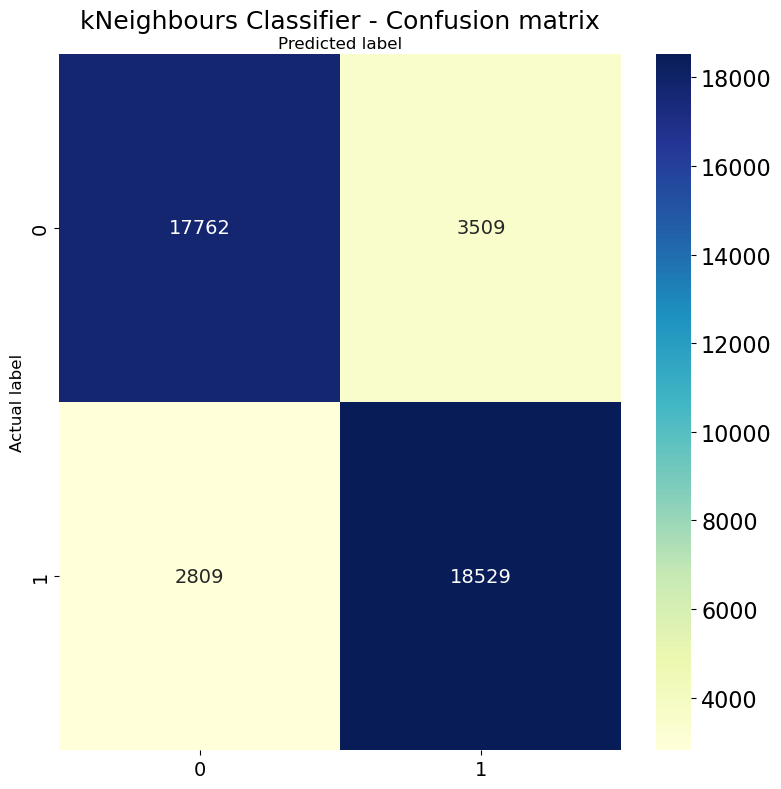

In [ ]:
# PLotting the kNeighbours Classifier - confusion matrix
class_names=[0,1] # name  of classes
fig, ax = plt.subplots(figsize=(8,8))
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names,fontsize=14)
plt.yticks(tick_marks, class_names,fontsize=14)
sns.heatmap(pd.DataFrame(knn_cnf_matrix), annot=True, annot_kws={"size":14}, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.title('kNeighbours Classifier - Confusion matrix', fontsize=18)
plt.ylabel('Actual label',fontsize=12)
plt.xlabel('Predicted label',fontsize=12)
plt.tight_layout()
plt.savefig(r'images\\knn_conf_matrix.png',dpi=300)

***Perceptron:***

In [ ]:
param_grid = {
    'eta0': [0.001, 0.01, 0.1,1],
    'alpha': [0.0001, 0.001, 0.01,0.1],
    'max_iter': [1000, 2000, 3000,4000]
}
grid_search = GridSearchCV(Perceptron(), param_grid, cv=10)
grid_search.fit(X_train, y_train)
print(grid_search.best_params_)

{'alpha': 0.0001, 'eta0': 0.001, 'max_iter': 1000}


In [ ]:
#Initializing the perceptron
model = Perceptron(eta0=0.001, max_iter=1000,alpha=0.0001)

#Training the model
model.fit(X_train, y_train)

prec_y_pred = model.predict(X_test)
#Confusion matrix for perceptron

prec_cnf_matrix = metrics.confusion_matrix(y_test, prec_y_pred)
print(prec_cnf_matrix)
print(classification_report(y_test, prec_y_pred, target_names=['no rain','rain']))

[[13133  8138]
 [ 2536 18802]]
              precision    recall  f1-score   support

     no rain       0.84      0.62      0.71     21271
        rain       0.70      0.88      0.78     21338

    accuracy                           0.75     42609
   macro avg       0.77      0.75      0.74     42609
weighted avg       0.77      0.75      0.75     42609



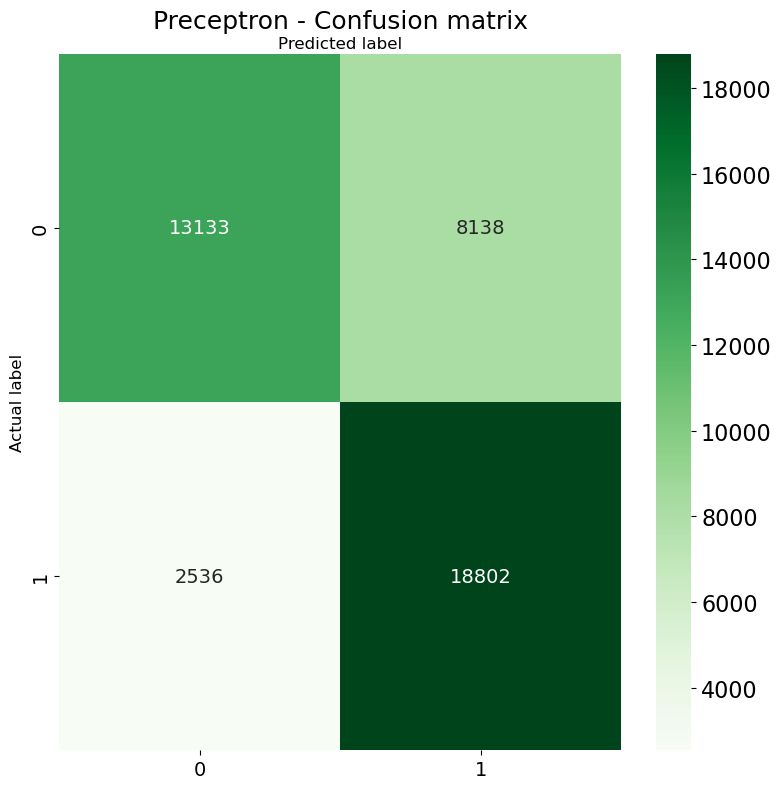

In [ ]:
# PLotting the Perceptron Classifier - confusion matrix
class_names=[0,1] # name  of classes
fig, ax = plt.subplots(figsize=(8,8))
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names,fontsize=14)
plt.yticks(tick_marks, class_names,fontsize=14)
sns.heatmap(pd.DataFrame(prec_cnf_matrix), annot=True, annot_kws={"size":14}, cmap="Greens" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.title('Preceptron - Confusion matrix', fontsize=18)
plt.ylabel('Actual label',fontsize=12)
plt.xlabel('Predicted label',fontsize=12)
plt.tight_layout()
plt.savefig(r'images\\preceptron_conf_matrix.png',dpi=300)

***Polynomial Regression (Regression Techniques):*** 

In [ ]:
# Splitting the data into training and test data with precip column as target
X1 = data[['temp','humidity','dew','surfpressure','cloudcover','windspeed100m','winddir100m','windgusts']]
y1 = data['precip']
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, test_size=0.2, random_state=42)

In [ ]:
poly = PolynomialFeatures(degree=4)
X_poly = poly.fit_transform(X_train1)

# Step 4: Fit the polynomial regression model
poly_model = LinearRegression()
poly_model.fit(X_poly, y_train1)

# Step 5: Predict on the test set (transform the features as well)
X_test_poly = poly.transform(X_test1)
poly_y_pred = poly_model.predict(X_test_poly)

poly_mse = mean_squared_error(y_test1, poly_y_pred)
poly_r2 = r2_score(y_test1, poly_y_pred)

print(f"Mean Squared Error for Polynomial Regression: {poly_mse}")
print(f"R-squared for Polynomial Regression: {poly_r2}")

Mean Squared Error for Polynomial Regression: 0.09277244713787616
R-squared for Polynomial Regression: 0.3059269878171824


In [ ]:
#Performing cross validation with LassoCV & RigdeCV
lasso_cv_model = LassoCV(cv=10)
lasso_cv_model.fit(X_train1, y_train1)

# Best alpha from cross-validation
print(f"Best alpha for Lasso: {lasso_cv_model.alpha_}")

# RidgeCV (Ridge with cross-validation for alpha)
ridge_cv_model = RidgeCV(cv=10)
ridge_cv_model.fit(X_train1, y_train1)

# Best alpha from cross-validation
print(f"Best alpha for Ridge: {ridge_cv_model.alpha_}")

c:\Users\sneha\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.617e+01, tolerance: 1.440e+00



Best alpha for Lasso: 0.0026358288467956677
Best alpha for Ridge: 10.0


In [ ]:
#Lasso 
lasso_model = Lasso(alpha=0.0026358288467956677,max_iter=5000)
lasso_model.fit(X_train1, y_train1)

# Predictions
lasso_y_pred = lasso_model.predict(X_test1)

# Evaluate the model using Mean Squared Error
lasso_mse = mean_squared_error(y_test1, lasso_y_pred)
print(f"Lasso Regression MSE: {lasso_mse}")
lasso_r2 = r2_score(y_test1, lasso_y_pred)
print(f"R2 score for Lasso : {lasso_r2}")

Lasso Regression MSE: 0.11276408059498651
R2 score for Lasso : 0.15636045507918417
